# Segment Anything Model (SAM) for Coastline Detection

## Available Datasource

In [ ]:
# read all tif file name in "data\Planet_data_EPSG28992"

import os
from datetime import datetime

planet_data_dir = "data/Planet_data_EPSG28992"
file_names = os.listdir(planet_data_dir)

# remove all names that have ".aux.xml" in them
file_names = [name for name in file_names if not name.endswith(".aux.xml")] 
# print(file_names)

# divide files into seasons based on leading YYYY-MM-DD in the filename
tif_files = [fn for fn in file_names if fn.lower().endswith(".tif") and len(fn) >= 10]

seasons = {"early": [], "mid": [], "late": []}
for fn in tif_files:
    try:
        dt = datetime.strptime(fn[:10], "%Y-%m-%d")
    except Exception:
        continue
    m = dt.month
    if 1 <= m <= 3:
        seasons["early"].append(fn)
    elif 4 <= m <= 9:
        seasons["mid"].append(fn)
    else:
        seasons["late"].append(fn)

# sort each season by date
for k in seasons:
    seasons[k].sort(key=lambda s: datetime.strptime(s[:10], "%Y-%m-%d"))

print({k: len(v) for k, v in seasons.items()})
seasons

{'early': 9, 'mid': 9, 'late': 7}


{'early': ['2017-03-16_strip_435861_composite.tif',
  '2018-02-22_strip_1201956_composite.tif',
  '2019-02-15_strip_2122432_composite.tif',
  '2020-02-07_strip_3113467_composite.tif',
  '2021-03-02_strip_4218715_composite.tif',
  '2022-03-08_strip_5468490_composite.tif',
  '2023-02-27_strip_6317538_composite.tif',
  '2024-03-02_strip_7145820_composite.tif',
  '2025-02-26_strip_7892478_composite.tif'],
 'mid': ['2017-07-06_strip_602670_composite.tif',
  '2018-06-29_strip_1532242_composite.tif',
  '2019-06-14_strip_2443911_composite.tif',
  '2020-06-24_strip_3512625_composite.tif',
  '2021-06-27_strip_4630194_composite.tif',
  '2022-06-21_strip_5728503_composite.tif',
  '2023-06-15_strip_6579851_composite.tif',
  '2024-06-23_strip_7392265_composite.tif',
  '2025-06-19_strip_8141392_composite.tif'],
 'late': ['2018-10-05_strip_1746499_composite.tif',
  '2019-10-16_strip_2755420_composite.tif',
  '2020-10-23_strip_3833704_composite.tif',
  '2021-10-15_strip_5001262_composite.tif',
  '2022-

In [2]:
from datetime import datetime

folder = "data\\Planet_data_EPSG28992\\"

summer_months = [
    "2025-06-19_strip_8141392_composite.tif",
    "2024-06-23_strip_7392265_composite.tif",
    "2023-06-15_strip_6579851_composite.tif",
    #"2022-10-09_strip_5992163_composite.tif",
    "2022-06-21_strip_5728503_composite.tif",
    "2021-06-27_strip_4630194_composite.tif",
    "2020-06-24_strip_3512625_composite.tif",
    "2019-06-14_strip_2443911_composite.tif",
    "2018-06-29_strip_1532242_composite.tif",
    "2017-07-06_strip_602670_composite.tif"
]

winter_months = [
    "2025-02-26_strip_7892478_composite.tif",
    "2024-10-05_strip_7618271_composite.tif",
    "2020-10-23_strip_3833704_composite.tif",
    "2020-02-07_strip_3113467_composite.tif",
    "2019-10-16_strip_2755420_composite.tif",
    "2019-02-15_strip_2122432_composite.tif",
    "2018-10-05_strip_1746499_composite.tif",
    "2018-02-22_strip_1201956_composite.tif",
    "2017-10-15_strip_838927_composite.tif"
]

# Sort lists by the leading YYYY-MM-DD date (ascending)
def _sort_by_date(lst):
    return sorted(lst, key=lambda s: datetime.strptime(s[:10], "%Y-%m-%d"))

summer_months = _sort_by_date(summer_months)
winter_months = _sort_by_date(winter_months)

In [3]:
# Replace summer_months with selected_files for subsequent operations

season_name = "late"
selected_files = seasons[season_name]

In [4]:
# print elements in selected_files and file sizes
import os
for fname in selected_files:
    fpath = os.path.join(folder, fname)
    if os.path.exists(fpath):
        fsize = os.path.getsize(fpath) / (1024 * 1024)
        print(f"{fname}: {fsize:.2f} MB")
    else:
        print(f"{fname}: file not found")

2018-10-05_strip_1746499_composite.tif: 27.22 MB
2019-10-16_strip_2755420_composite.tif: 27.22 MB
2020-10-23_strip_3833704_composite.tif: 27.22 MB
2021-10-15_strip_5001262_composite.tif: 27.22 MB
2022-10-09_strip_5992163_composite.tif: 27.22 MB
2023-10-17_strip_6840706_composite.tif: 27.22 MB
2024-10-05_strip_7618271_composite.tif: 27.22 MB


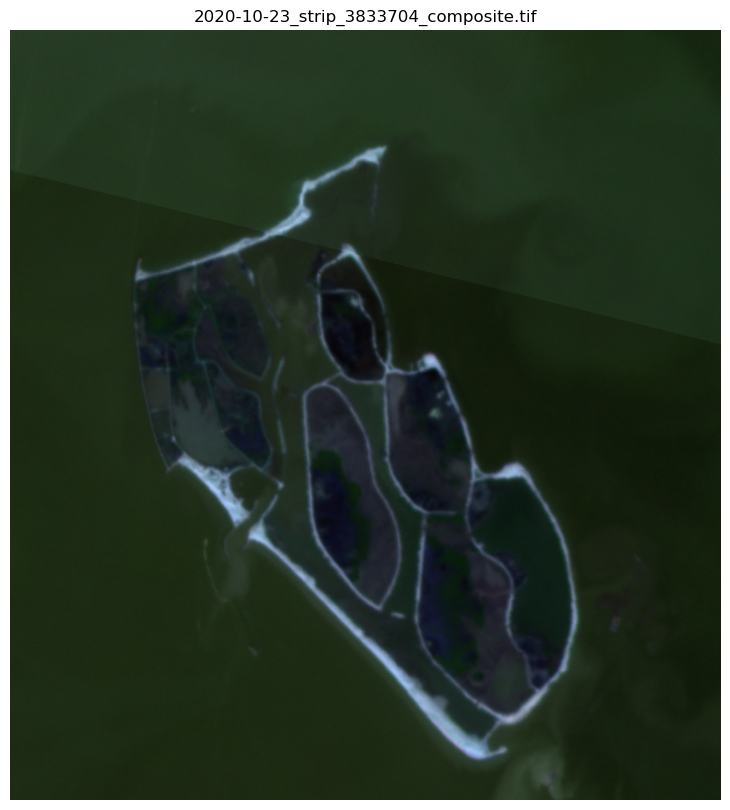

In [5]:
import os
import numpy as np
import rasterio

import matplotlib.pyplot as plt

# index of the file to plot
idx = 2

fname = selected_files[idx]
fpath = os.path.join(folder, fname)

if not os.path.exists(fpath):
    print(f"File not found: {fpath}")
else:
    with rasterio.open(fpath) as src:
        count = src.count
        if count >= 3:
            # read first 3 bands as RGB
            img = np.stack([src.read(i) for i in (1, 2, 3)], axis=-1).astype(np.float32)

            # # simple contrast stretch using 2nd and 98th percentiles per band
            # img_norm = np.zeros_like(img, dtype=np.float32)
            # for b in range(3):
            #     p15, p98 = np.percentile(img[:, :, b], (15, 98))
            #     img_norm[:, :, b] = np.clip((img[:, :, b] - p15) / (p98 - p15 + 1e-9), 0, 1)

            # normalize image using min-max normalization across all bands
            img_norm = (img - img.min()) / (img.max() - img.min() + 1e-12)

            plt.figure(figsize=(10, 10))
            plt.imshow(img_norm)
        else:
            # single-band grayscale
            arr = src.read(1)
            p15, p98 = np.percentile(arr, (15, 98))
            arr_norm = np.clip((arr - p15) / (p98 - p15 + 1e-9), 0, 1)
            plt.figure(figsize=(8, 8))
            plt.imshow(arr_norm, cmap="gray")

    plt.title(fname)
    plt.axis("off")
    plt.show()

In [15]:
# !pip install git+https://github.com/facebookresearch/segment-anything.git
# !pip install opencv-python-headless matplotlib

In [16]:
# install missing runtime packages (fixes ModuleNotFoundError: No module named 'torch')
# use %pip so packages are installed into the current Jupyter environment
# %pip install torch torchvision torchaudio --quiet
# %pip install git+https://github.com/facebookresearch/segment-anything.git --quiet
# %pip install geopandas --quiet

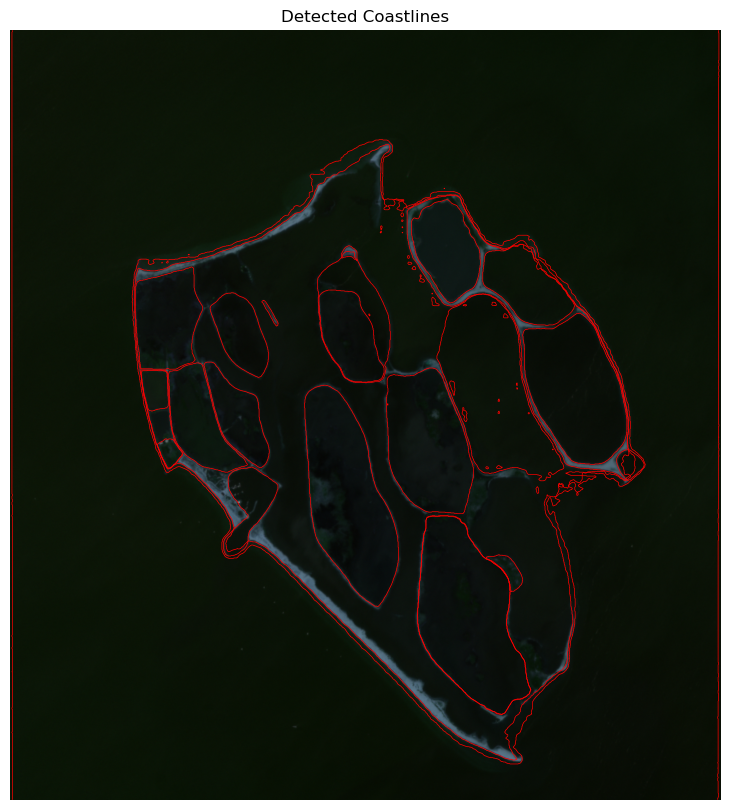

c:\Users\Move\anaconda3\envs\gds24\lib\site-packages\pyogrio\geopandas.py:662: UserWarning: 'crs' was not provided.  The output dataset will not have projection information defined and may not be usable in other systems.
  write(


Coastlines saved to 'coastlines.geojson'


In [6]:
import os
import numpy as np
import rasterio
import matplotlib.pyplot as plt
from segment_anything import sam_model_registry, SamAutomaticMaskGenerator
from shapely.geometry import shape
from rasterio.features import shapes

# Load SAM model (download checkpoint automatically if missing)
sam_checkpoint = "sam_vit_h_4b8939.pth"  # Download this from SAM's GitHub if missing
if not os.path.exists(sam_checkpoint):
    print(f"Checkpoint '{sam_checkpoint}' not found. Downloading...")
    url = "https://dl.fbaipublicfiles.com/segment_anything/sam_vit_h_4b8939.pth"
    import urllib.request
    try:
        urllib.request.urlretrieve(url, sam_checkpoint)
        print("Download complete.")
    except Exception as e:
        raise RuntimeError(f"Failed to download SAM checkpoint from {url}: {e}")
    
# Load SAM model
sam = sam_model_registry["vit_h"](checkpoint=sam_checkpoint)
mask_generator = SamAutomaticMaskGenerator(sam)

# Load satellite image
folder = "data/Planet_data_EPSG28992/"
fname = "2025-06-19_strip_8141392_composite.tif"  # Example file
fpath = os.path.join(folder, fname)

with rasterio.open(fpath) as src:
    img = np.stack([src.read(i) for i in (1, 2, 3)], axis=-1).astype(np.float32)
    # Normalize image for SAM
    img = (img - img.min()) / (img.max() - img.min())

# Generate masks using SAM
masks = mask_generator.generate(img)

# Visualize masks
plt.figure(figsize=(10, 10))
plt.imshow(img)
for mask in masks:
    plt.contour(mask["segmentation"], colors="red", linewidths=0.5)
plt.title("Detected Coastlines")
plt.axis("off")
plt.show()

# Extract coastlines as vector geometries
coastlines = []
for mask in masks:
    mask_array = mask["segmentation"].astype("uint8")
    for geom, val in shapes(mask_array, transform=src.transform):
        if val == 1:  # Extract only the mask region
            coastlines.append(shape(geom))

# Save coastlines as GeoJSON
import geopandas as gpd
gdf = gpd.GeoDataFrame({"geometry": coastlines})
gdf.to_file("coastlines.geojson", driver="GeoJSON")
print("Coastlines saved to 'coastlines.geojson'")

In [7]:
season_name = "early"
selected_files = seasons[season_name][5:]
selected_files

['2022-03-08_strip_5468490_composite.tif',
 '2023-02-27_strip_6317538_composite.tif',
 '2024-03-02_strip_7145820_composite.tif',
 '2025-02-26_strip_7892478_composite.tif']

Saved: SAM_results\2022-03-08_strip_5468490_composite_coastlines.geojson


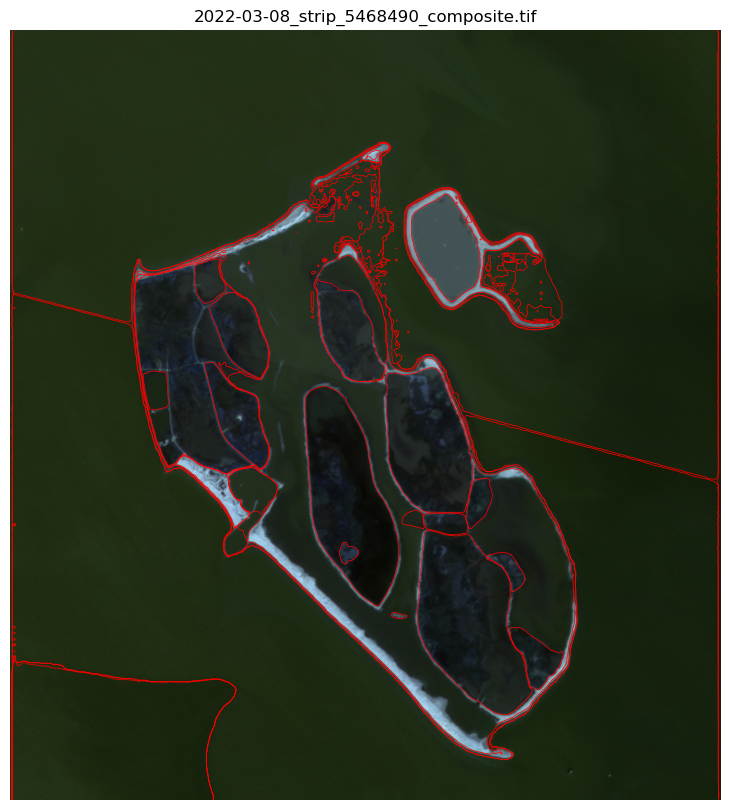

Overlay saved: SAM_results\2022-03-08_strip_5468490_composite_coastlines.png
Saved: SAM_results\2023-02-27_strip_6317538_composite_coastlines.geojson


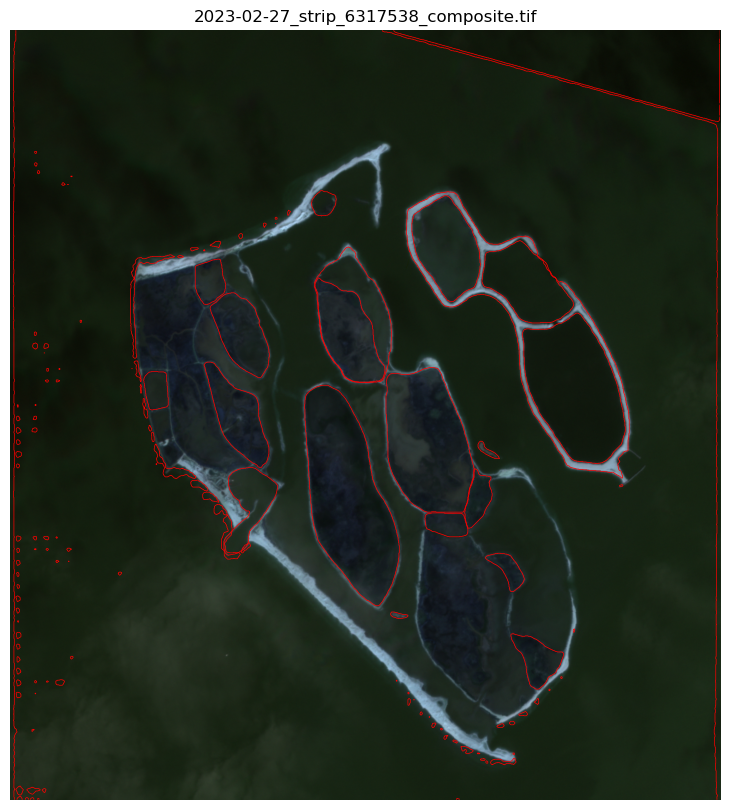

Overlay saved: SAM_results\2023-02-27_strip_6317538_composite_coastlines.png
Saved: SAM_results\2024-03-02_strip_7145820_composite_coastlines.geojson


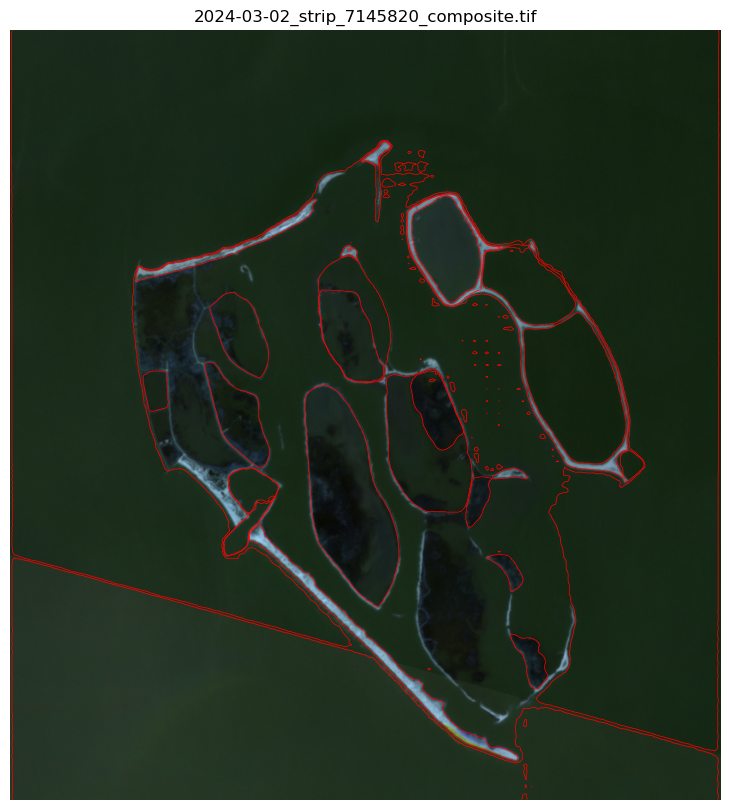

Overlay saved: SAM_results\2024-03-02_strip_7145820_composite_coastlines.png
Saved: SAM_results\2025-02-26_strip_7892478_composite_coastlines.geojson


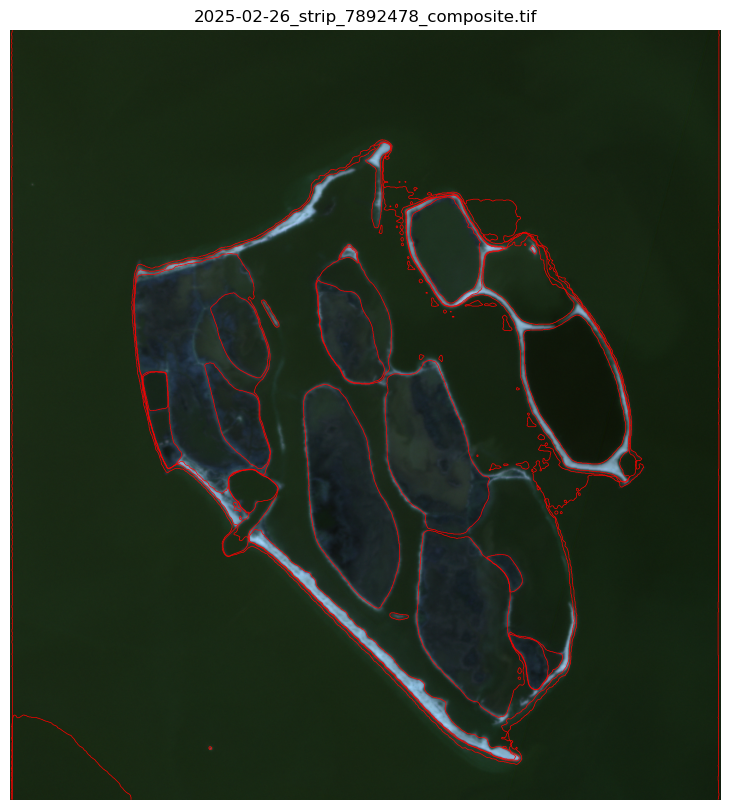

Overlay saved: SAM_results\2025-02-26_strip_7892478_composite_coastlines.png


In [8]:
import os

# Extract coastlines for all files in selected_files, save GeoJSONs and PNG overlays in SAM_results,
# and plot contours on the original RGB image.

output_dir = "SAM_results"
os.makedirs(output_dir, exist_ok=True)

for fname in selected_files:
    fpath = os.path.join(folder, fname)
    if not os.path.exists(fpath):
        print(f"File not found, skipping: {fpath}")
        continue

    try:
        with rasterio.open(fpath) as src:
            # Read RGB (or single band) and normalize for SAM
            if src.count >= 3:
                img = np.stack([src.read(i) for i in (1, 2, 3)], axis=-1).astype(np.float32)
            else:
                arr = src.read(1).astype(np.float32)
                img = np.repeat(arr[:, :, None], 3, axis=2)

            img = (img - img.min()) / (img.max() - img.min() + 1e-12)

            # Generate masks via SAM
            masks = mask_generator.generate(img)

            # Convert masks to geospatial polygons using the raster transform
            coast_geoms = []
            for mask in masks:
                mask_array = mask["segmentation"].astype("uint8")
                for geom, val in shapes(mask_array, transform=src.transform):
                    if val == 1:
                        coast_geoms.append(shape(geom))

            # Save GeoJSON if any geometries found
            if coast_geoms:
                gdf_out = gpd.GeoDataFrame({"geometry": coast_geoms}, crs=src.crs)
                out_geo = os.path.join(output_dir, os.path.splitext(fname)[0] + "_coastlines.geojson")
                gdf_out.to_file(out_geo, driver="GeoJSON")
                print(f"Saved: {out_geo}")
            else:
                print(f"No coastlines extracted for {fname}")

            # Plot original image and overlay mask contours
            plt.figure(figsize=(10, 10))
            plt.imshow(img)
            for mask in masks:
                plt.contour(mask["segmentation"], colors="red", linewidths=0.5)
            plt.title(fname)
            plt.axis("off")

            out_png = os.path.join(output_dir, os.path.splitext(fname)[0] + "_coastlines.png")
            plt.savefig(out_png, bbox_inches="tight", dpi=150)
            plt.show()
            print(f"Overlay saved: {out_png}")

    except Exception as e:
        print(f"Error processing {fname}: {e}")

## Test the saved shorelines

In [9]:
output_dir

'SAM_results'

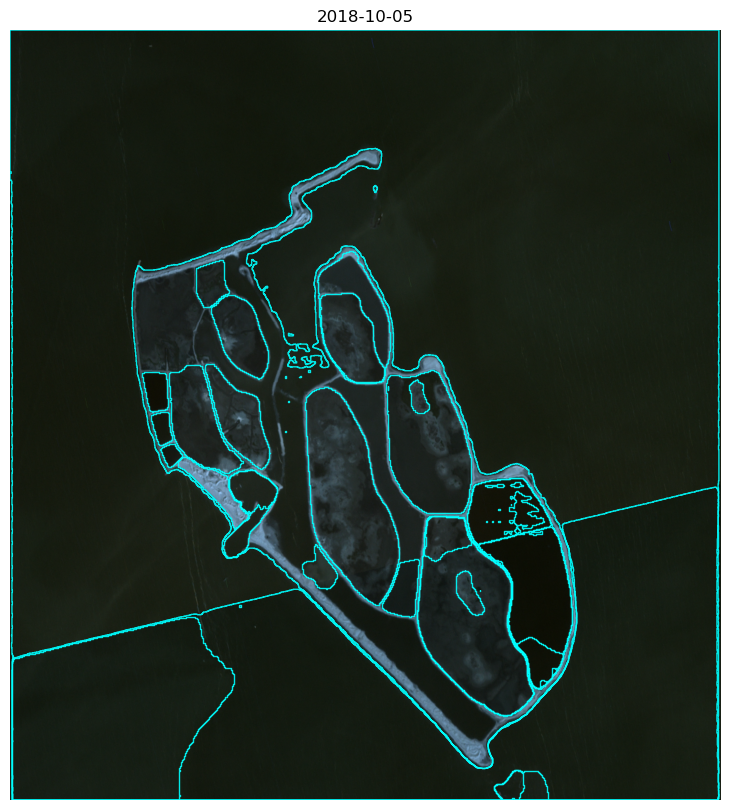

Saved overlay: SAM_results/late\2018-10-05_strip_1746499_composite_coastlines_overlay.png


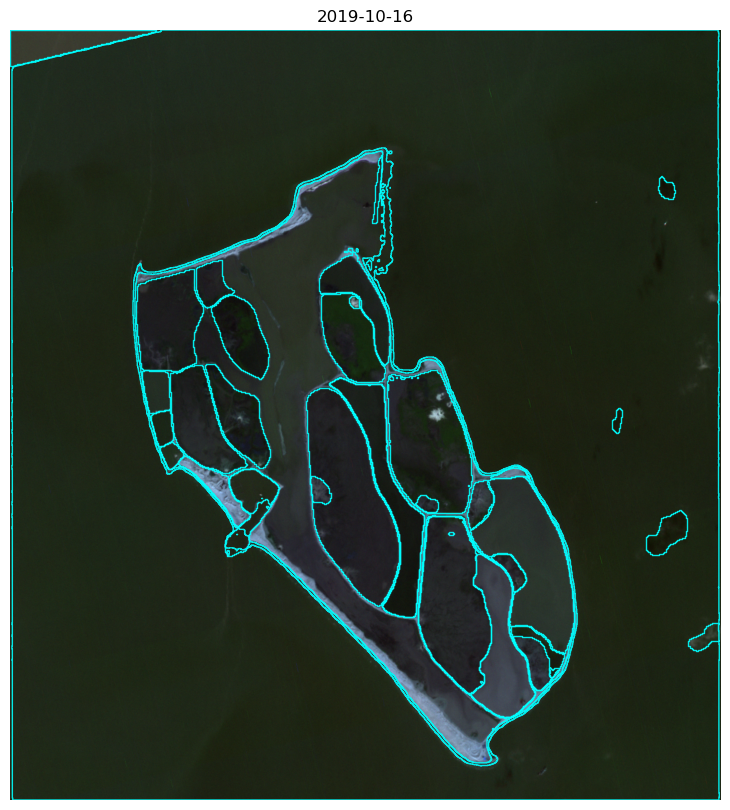

Saved overlay: SAM_results/late\2019-10-16_strip_2755420_composite_coastlines_overlay.png


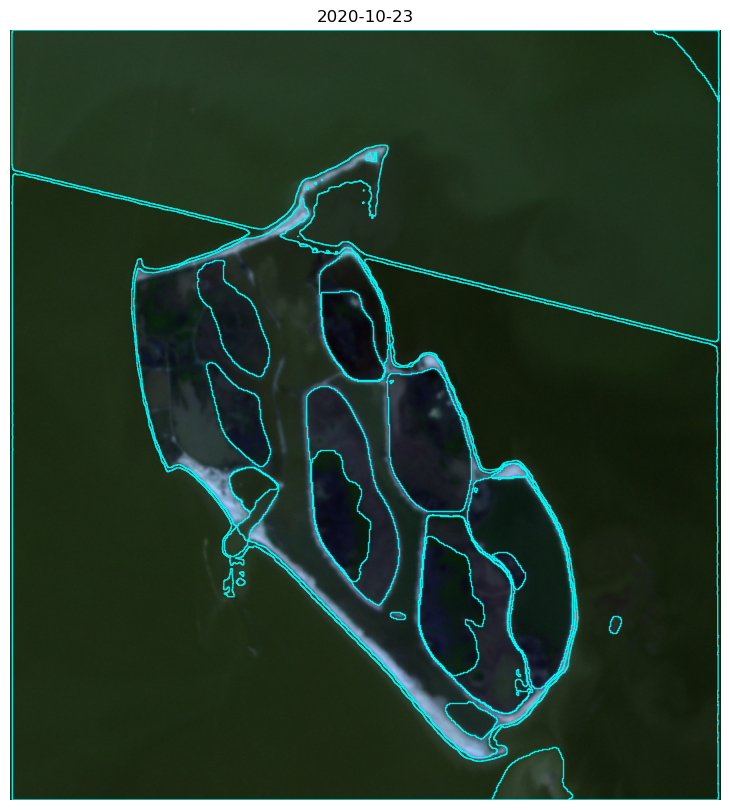

Saved overlay: SAM_results/late\2020-10-23_strip_3833704_composite_coastlines_overlay.png


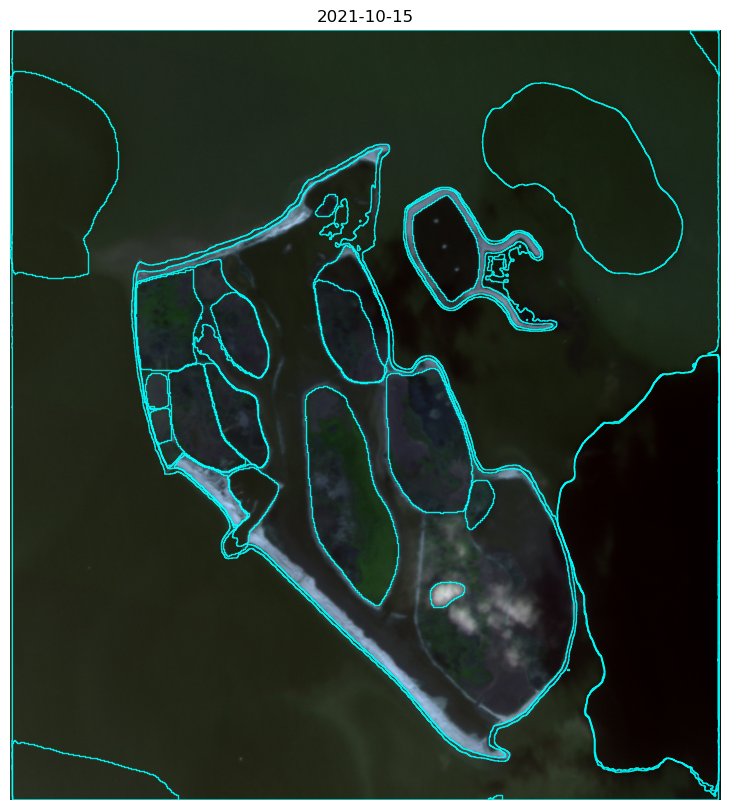

Saved overlay: SAM_results/late\2021-10-15_strip_5001262_composite_coastlines_overlay.png


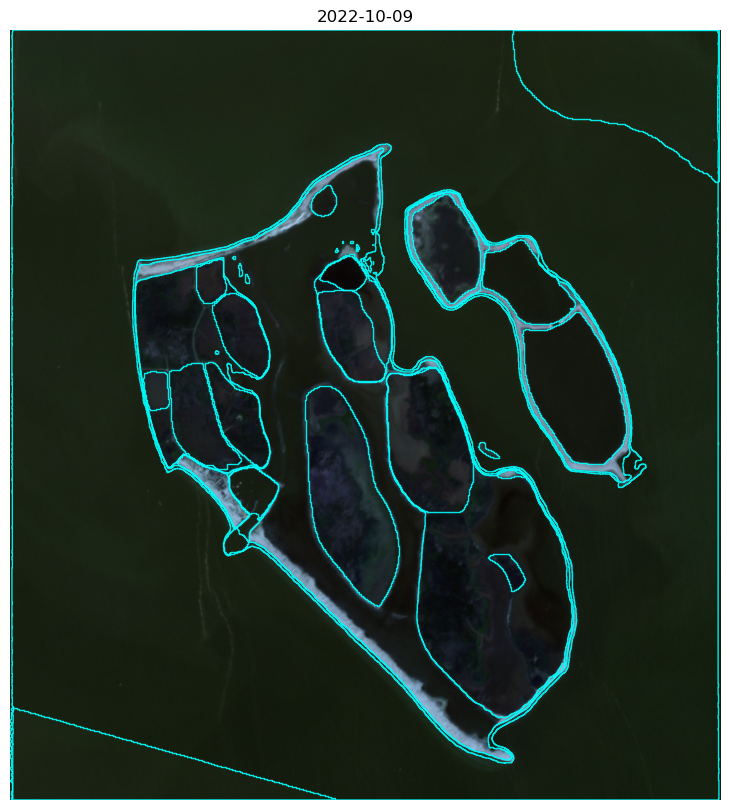

Saved overlay: SAM_results/late\2022-10-09_strip_5992163_composite_coastlines_overlay.png


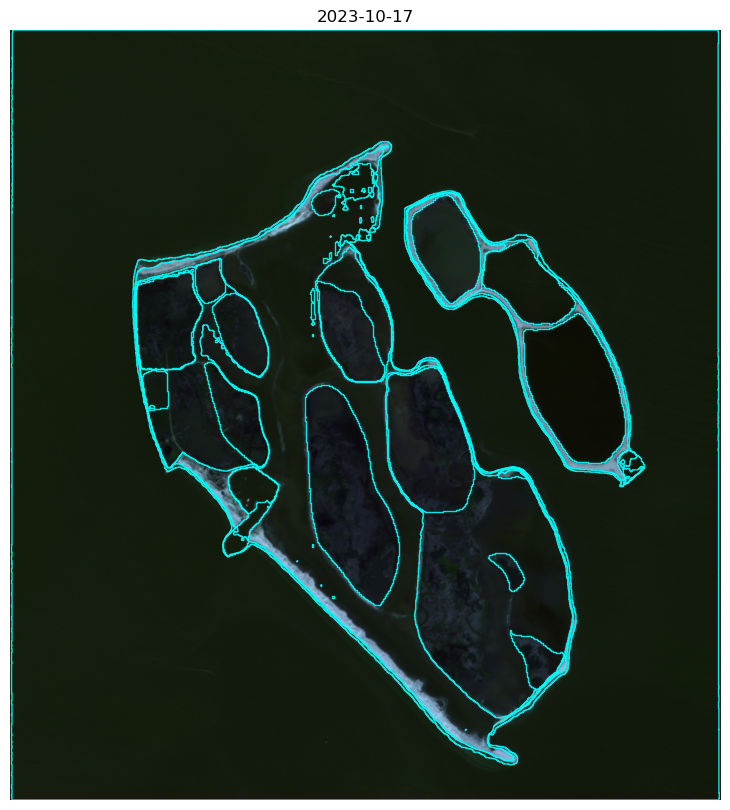

Saved overlay: SAM_results/late\2023-10-17_strip_6840706_composite_coastlines_overlay.png


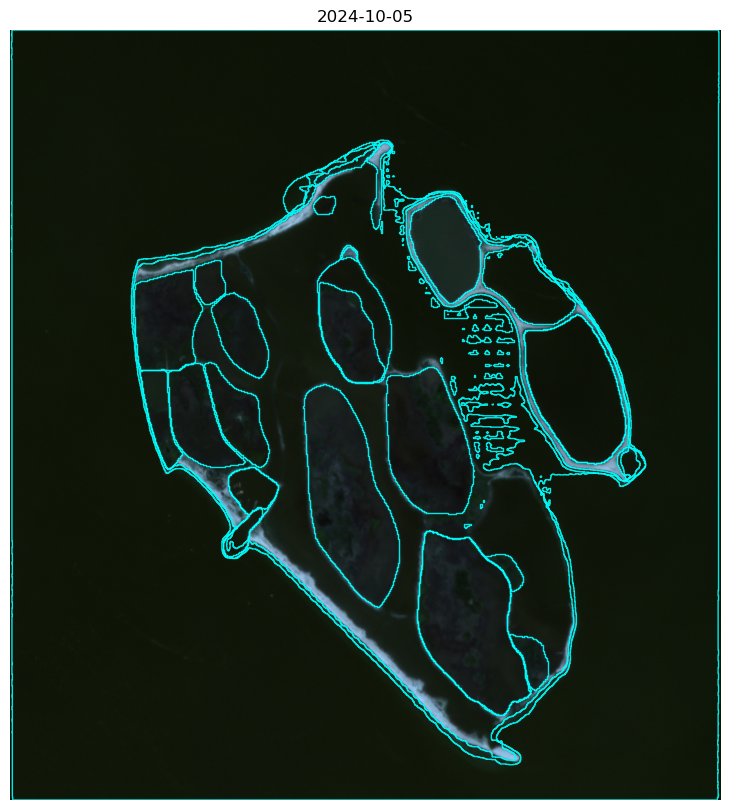

Saved overlay: SAM_results/late\2024-10-05_strip_7618271_composite_coastlines_overlay.png


In [ ]:
### Plot saved shorelines (overlay GeoJSON on the original RGB image)

# Use the GeoJSON files in `SAM_results` and the matching TIFF in `folder`. The code below
# iterates saved `_coastlines.geojson` files, opens the corresponding TIFF, displays the RGB
# (or single-band) image with the shoreline polygons overlaid, and saves an overlay PNG next to each GeoJSON.

# output_dir = "SAM_results/{season_name}"
season_name = "late"
output_dir = "SAM_results/" + season_name

for geo_fn in sorted(os.listdir(output_dir)):
    if not geo_fn.endswith("_coastlines.geojson"):
        continue

    geo_path = os.path.join(output_dir, geo_fn)
    tif_name = geo_fn.replace("_coastlines.geojson", ".tif")
    tif_path = os.path.join(folder, tif_name)

    if not os.path.exists(tif_path):
        print(f"Skipping (tif not found): {tif_name}")
        continue

    # build output PNG path here, after geo_fn is defined
    out_png = os.path.join(output_dir, os.path.splitext(geo_fn)[0] + "_overlay.png")

    gdf_plot = gpd.read_file(geo_path)

    with rasterio.open(tif_path) as src:
        if src.count >= 3:
            img_plot = np.stack([src.read(i) for i in (1, 2, 3)], axis=-1).astype(np.float32)
        else:
            arr = src.read(1).astype(np.float32)
            img_plot = np.repeat(arr[:, :, None], 3, axis=2)

        img_plot = (img_plot - img_plot.min()) / (img_plot.max() - img_plot.min() + 1e-12) # normalize
        extent = [src.bounds.left, src.bounds.right, src.bounds.bottom, src.bounds.top]

    fig, ax = plt.subplots(figsize=(10, 10))
    ax.imshow(img_plot, extent=extent)
    gdf_plot.plot(ax=ax, facecolor="none", edgecolor="cyan", linewidth=1, alpha=0.9)
    ax.set_title(tif_name[:10])
    ax.axis("off")

    plt.savefig(out_png, bbox_inches="tight", dpi=150)
    plt.show()
    print(f"Saved overlay: {out_png}")